# **Instructions**

This document is a template, and you are not required to follow it exactly. However, the kinds of questions we ask here are the kinds of questions we want you to focus on. While you might have answered similar questions to these in your project presentations, we want you to go into a lot more detail in this write-up; you can refer to the Lab homeworks for ideas on how to present your data or results. 

You don't have to answer every question in this template, but you should answer roughly this many questions. Your answers to such questions should be paragraph-length, not just a bullet point. You likely still have questions of your own -- that's okay! We want you to convey what you've learned, how you've learned it, and demonstrate that the content from the course has influenced how you've thought about this project.

# Project Name
Project mentor: Anqi Liu, Aditya

Runyu Gao <rgao18@jh.edu>, Chi Zhang <czhan168@jh.edu>, Kaixuan Zhang <kzhang93@jh.edu>

https://github.com/runyugao/MachineLearningProject.git

# Outline and Deliverables

List the deliverables from your project proposal. For each uncompleted deliverable, please include a sentence or two on why you weren't able to complete it (e.g. "decided to use an existing implementation instead" or "ran out of time"). For each completed deliverable, indicate which section of this notebook covers what you did.

If you spent substantial time on any aspects that weren't deliverables in your proposal, please list those under "Additional Work" and indicate where in the notebook you discuss them.

### Uncompleted Deliverables
1. Replace different activation functions for optimization, so as to minimize the loss of loss function. (There is no need to do this, the type of activation function does not affect the result. Thus, we decide to use an existing function)
2. Combine multiple pictures, one main picture adopts the style and color of two pictures at the same time. (Ran out of Time)
3. Transform the original method of generating a new image with the help of the features of one photo into fusion focusing two images (Ran out of Time)


### Completed Deliverables
1. Successfully build the convolutional neural network for features selection.
2. Combine a black and white photo is with a cartoon picture to produce a new picture in which the black and white photo is given the color of the cartoon.
3. Improve image spatial resolution and geometric accuracy.
4. When the size of the input image block is set as 16*16, the features of the output image are significant, the contour definition of the original image is high.
5. When the size of the input image block is set as 32*32, the features of the output image are significant, the contour definition of the original image is high.
6. When the size of the input image block is set as 8*8, the features of the output image are significant, the contour definition of the original image is high. (For the image contains too little feature information, which may reduce the accuracy of image classification).


### Additional Completed Deliverables
1. We successfully use the VGG19 CNN model to perfectly transfer art style to generate a styled content image.
2. We could control the degree of art style in the result image by changing the number of epochs and steps per epoch.

# Preliminaries

0. What problem were you trying to solve or understand?
  
  *We are trying to generate an image that has the content from one image and style from other art image. We are going to use CNN to solve this problem.*
1. What are the real-world implications of this data and task?

  *There are many real-world apps it to beautify photos like VSCO and Snapseed.*



2. How is this problem similar to others we’ve seen in lectures, breakouts, and homeworks?

  *In deep learning lecture, there has an example of image generation that take an image and a painting, render the image in the style of the painting.*


3. What is the ethical issue?

  *The pictures being choose should not infringe on other people's portrait rights, resolutely do not use unauthorized and non-public pictures. Also, the generated images should not violate the rights of intellectual property of artists.*

## Dataset(s)

1. Describe the dataset(s) you used.

  *Our dataset is consisted with two kinds of images: content images which provide content to the generated result; style images which need to transfer style.*
  

2. How were they collected?

  *We collect them from Google Image Search mainly.*


3. How many examples in each?

  *Because our model is a generative model, we do not need a very large data set. Actually, at least we only need 2 examples: one content image and one style image.*

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


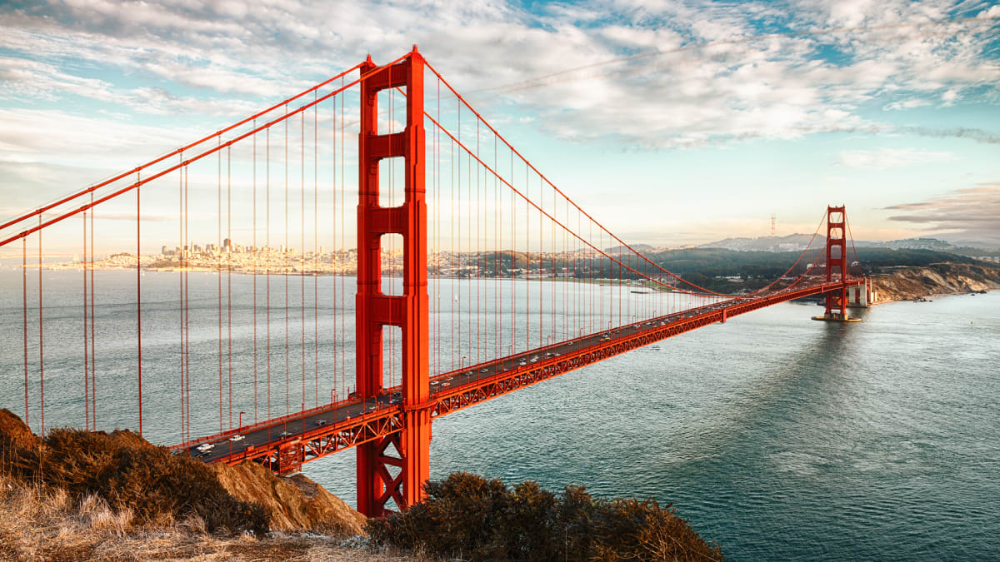

In [ ]:
# Load your data and print 2-3 examples
from IPython.display import Image
print('content image example')
Image(filename='/content/drive/MyDrive/bridge.jpg')

style image example


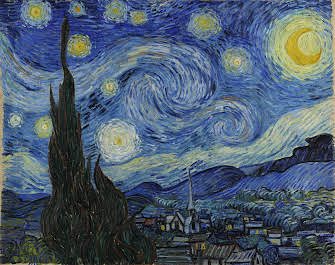

In [ ]:
print('style image example')
Image(filename='/content/drive/MyDrive/starry.jpeg')

## Pre-processing

What approach(es) did you use to pre-process your data? Why?

*For following use, we have to resize the images to at most 512 pixels each and convert them into tensor. Because we must deal with the dimension issues if we do not resize them into the same size. Also, smaller size would help faster training. Below is our function code to preprocess the image data.*

In [ ]:
import tensorflow as tf
def LoadImage(PathToImage):
  img = tf.io.read_file(PathToImage)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)
  ImageShape = tf.cast(tf.shape(img)[:-1], tf.float32)
  img = tf.image.resize(img, tf.cast(ImageShape * (512 / max(ImageShape)), tf.int32))
  resImage = img[tf.newaxis, :]
  return resImage

In [ ]:
# For those same examples above, what do they look like after being pre-processed?: IT BECAME A TENSOR!
im = LoadImage('/content/drive/MyDrive/bridge.jpg')
print(im)

tf.Tensor(
[[[[0.25313172 0.44136703 0.4909994 ]
   [0.25763923 0.44182947 0.48100397]
   [0.27334562 0.44372228 0.47235948]
   ...
   [0.18360716 0.4745826  0.5651243 ]
   [0.23790692 0.54103386 0.6246525 ]
   [0.41552356 0.5900812  0.6382497 ]]

  [[0.26956764 0.43937942 0.46930245]
   [0.29859358 0.4511652  0.47861427]
   [0.31967393 0.45369852 0.47574013]
   ...
   [0.2023409  0.514299   0.5986912 ]
   [0.19118223 0.5398926  0.6104799 ]
   [0.26270396 0.5678098  0.6060451 ]]

  [[0.318683   0.47113976 0.4874665 ]
   [0.37486023 0.49476966 0.5052084 ]
   [0.4129902  0.49532688 0.50960386]
   ...
   [0.40612364 0.5848614  0.6273859 ]
   [0.43814436 0.58183306 0.6299336 ]
   [0.5003897  0.62459886 0.6816177 ]]

  ...

  [[0.43888253 0.32180896 0.19865869]
   [0.5980249  0.4217946  0.27273571]
   [0.6314731  0.37608477 0.19196731]
   ...
   [0.13036248 0.23655123 0.23122033]
   [0.21352254 0.32972103 0.3218779 ]
   [0.19743222 0.31672797 0.3080605 ]]

  [[0.426642   0.30100915 0.211793

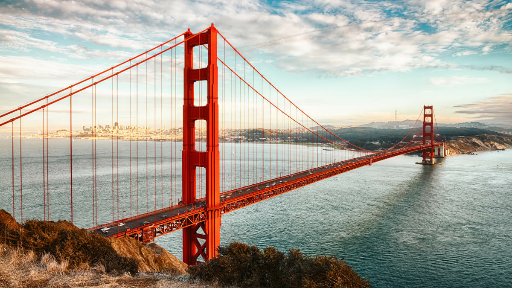

In [ ]:
#Below is my code could transform tensor to image back
import numpy as np
import PIL
def TensorToImage(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)
TensorToImage(im)

Above is the resized image, we can find it is much smaller.

# Models and Evaluation

## Experimental Setup

1. How did you evaluate your methods? Why is that a reasonable evaluation metric for the task?

  *We would like to compare the result to both the content image and style image to measure the generative accuracy, because it is the most effective way to evaluate our result. The network has two identical branches that share weights to learn the feature representation of the input image. The input data are usually paired image blocks, which are respectively used as the input of two networks, and the similarity of the two input image blocks can be measured by the loss function.*

2. What did you use for your loss function to train your models? Did you try multiple loss functions? Why or why not?

  *About the Loss function, given a selected content layer L, the content loss is defined as the mean square error between the feature map F of our content image C and the feature map P of our generated image Y. We compute the output of each image and the mean square error of the target, and then take the weighted sum of these loss values and updating the images. Loss function adds both the style loss and the content loss; then trying to minimize it by gradient descent. We do not need to try multiple loss function because there is no other loss function available in our model*

3. How did you split your data into train and test sets? Why?

  *It is a generative model so we do not need to do this.*

In [ ]:
# Code for loss functions, evaluation metrics or link to Git repo
def StyleContentLoss(outputs):
    StyleOutputs = outputs['style']
    ContentOutputs = outputs['content']
    StyleLoss = tf.add_n([tf.reduce_mean((StyleOutputs[name]-StyleTargets[name])**2) for name in StyleOutputs.keys()])
    StyleLoss *= 1e-2 / 5
    ContentLoss = tf.add_n([tf.reduce_mean((ContentOutputs[name]-ContentTargets[name])**2) for name in ContentOutputs.keys()])
    ContentLoss *= 1e4
    loss = StyleLoss + ContentLoss
    return loss
 

opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)
@tf.function()
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = StyleContentLoss(outputs)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0))

## Baselines 

What baselines did you compare against? Why are these reasonable?

*At least we should Combine a black and white photo is with a colored cartoon picture to produce a new picture in which the black and white photo is given the color of the cartoon. Because black-white images are the simplest content images with little noises. Also, colored cartoon are also simple in style. Thus, we must finish this.*



## Methods

1. What methods did you choose? Why did you choose them?

  *We choose convolutional neural network (CNN). Especially we choose VGG19, a pre-trained CNN model. We use it because it could use hierarchical representations from original images in a unified framework for replication and optimization. Also, there are more layers in VGG19 than other pretrained CNN models, thus our generated image would be more accurate and clear. The intermediate layers of the model are used to obtain the content and style representation of the image. Starting with the input layer of the network, the  first few layers represent low-level features such as edges and textures. As the layers deepen, the last layers represent higher-level features: parts of entities, such as wheels or eyes. These intermediate layers are necessary to define a representation of content and style from the image. For an input image, we try to match the corresponding style and content target representations of these intermediate layers. The style of an image can be described by the mean value and correlation on different feature maps. By computing the outer product of the feature vectors at each position and averaging this outer product over all positions, a Gramian Matrix containing this information can be computed. The Gramian Matrix for a particular layer is calculated as follows: $$G_{cd} = \frac{\sum_{ij} F_{ijc}(x)F_{ijd}(x)}{IJ}$$*

2. How did you train these methods, and how did you evaluate them? Why?

  *It extracts the features of the input image through learning filters, so as to obtain different feature maps at each layer. If we adopt the trained convolutional neural network to identify the objects in the image (such as style and color), then the network will build, output, and containing the similar features as the given image content and style. We could evaluate it from the loss function. Below is our gram matrix of style_layers and content layer. We also use this matrix data to extract the style and content features.*

  block1_conv1

  Styles shape: (1, 64, 64)

  Styles min: 0.0055228471755981445

  Styles max: 28014.55859375

  Styles mean: 263.7902526855469

  block2_conv1

  Styles shape: (1, 128, 128)

  Styles min: 0.0

  Styles max: 61479.50390625

  Styles mean: 9100.9501953125

  block3_conv1

  Styles shape: (1, 256, 256)

  Styles min: 0.0

  Styles max: 545623.4375

  Styles mean: 7660.9765625

  block4_conv1

  Styles shape: (1, 512, 512)

  Styles min: 0.0

  Styles max: 4320501.0

  Styles mean: 134288.859375

  block5_conv1

  Styles shape: (1, 512, 512)

  Styles min: 0.0

  Styles max: 110005.3828125

  Styles mean: 1487.0380859375

  Contents:

  block5_conv2

  Contents shape: (1, 26, 32, 512)

  Contents min: 0.0

  Contents max: 2410.879638671875

  Contents mean: 13.764151573181152

3. For each method, what hyperparameters did you evaluate? How sensitive was your model's performance to different hyperparameter settings?

  *We mainly focus on the number of epoch and steps per epoch, because the number of epoch could decide the degree of combination of images and the number of steps per epoch could decide the sophistication of the detail of image combination. Generally, more epochs, deeper the fusion; more steps, more sophisticated details.*

In [ ]:
# Code for training models, or link to your Git repository
def VGGLayers(LayerName):
  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False
  outputs = []
  for name in LayerName:
    outputs.append(vgg.get_layer(name).output)
  return tf.keras.Model([vgg.input], outputs)

def GramMatrix(InputTensor):
  result = tf.linalg.einsum('bijc,bijd->bcd', InputTensor, InputTensor)
  input_shape = tf.shape(InputTensor)
  num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
  return result/(num_locations)

class StyleContentModel(tf.keras.models.Model):
  def __init__(self, StyleLayers, ContentLayers):
    super(StyleContentModel, self).__init__()
    self.vgg = VGGLayers(StyleLayers + ContentLayers)
    self.vgg.trainable = False
    self.StyleLayers = StyleLayers
    self.ContentLayers = ContentLayers
    self.NumStyleLayer = len(StyleLayers)
   

  def call(self, inputs):
    "Expects float input in [0,1]"
    inputs = inputs*255.0
    outputs = self.vgg(tf.keras.applications.vgg19.preprocess_input(inputs))
    StyleOutputs, ContentOutputs = (outputs[:self.NumStyleLayer], outputs[self.NumStyleLayer:])
    StyleOutputs = [GramMatrix(style_output) for style_output in StyleOutputs]
    ContentDict = {content_name: value for content_name, value in zip(self.ContentLayers, ContentOutputs)}
    StyleDict = {style_name: value for style_name, value in zip(self.StyleLayers, StyleOutputs)}
    return {'content': ContentDict, 'style': StyleDict}

opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)
@tf.function()
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = StyleContentLoss(outputs)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0))

start = time.time()
epochs = args.epoch
steps_per_epoch = args.steps_per_epoch
print("\n Training:")
step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(Image)
    print("*", end='', flush=True)
  print("Training step: {}".format(step))
SaveImage(TensorToImage(Image), './training/StyledContent.png')
end = time.time()
print("Training Complete! Total time: {}".format(end-start))

epoch 1


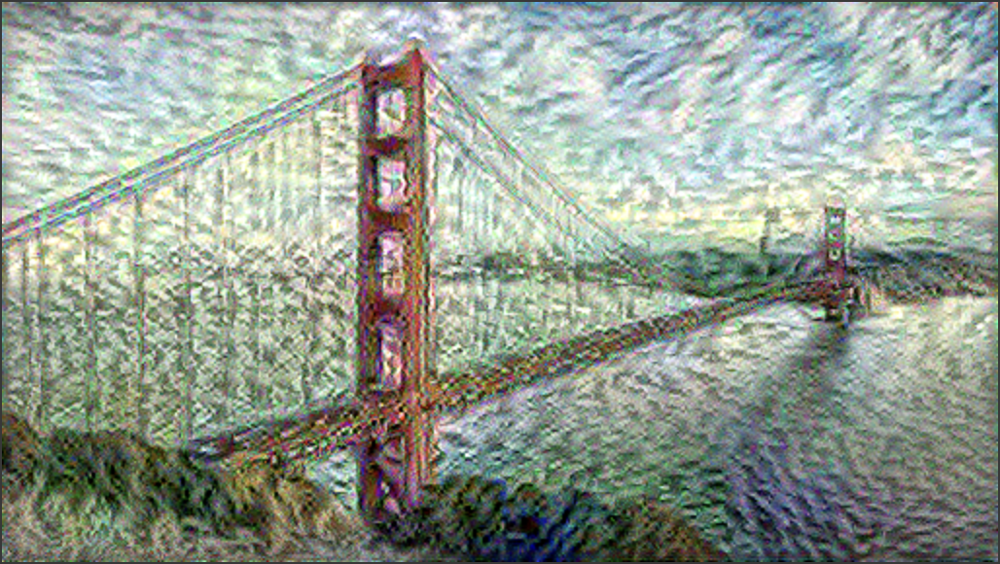

In [ ]:
# Show plots of how these models performed during training.
# We would show how does the styled content result look like in training.
# For example, plot train loss and train accuracy (or other evaluation metric) on the y-axis,
# with number of iterations or number of examples on the x-axis.
print('epoch 1')
Image(filename='/content/drive/MyDrive/1.png')

epoch 3


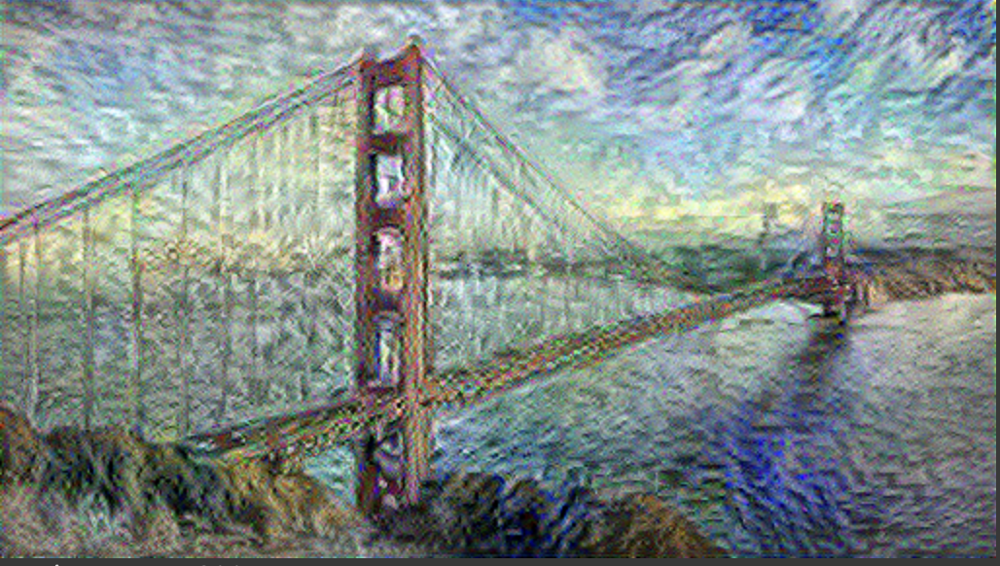

In [ ]:
print('epoch 3')
Image(filename='/content/drive/MyDrive/2.png')

epoch 5


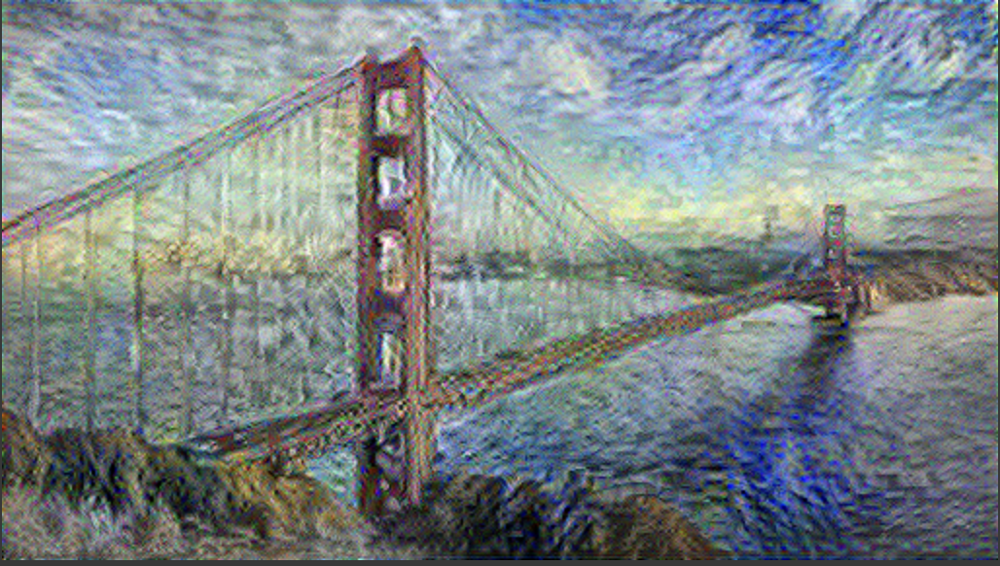

In [ ]:
print('epoch 5')
Image(filename='/content/drive/MyDrive/3.png')

epoch 7


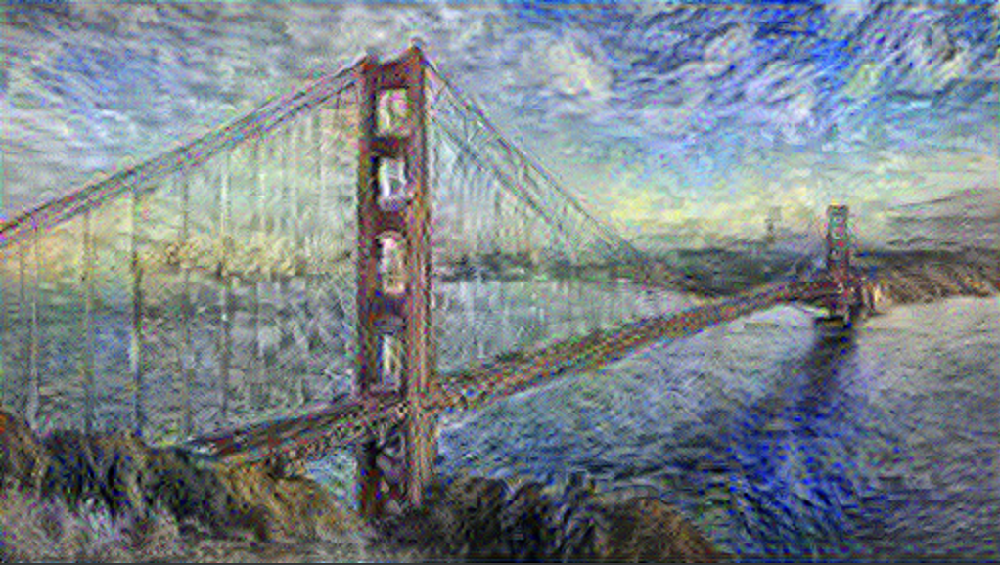

In [ ]:
print('epoch 7')
Image(filename='/content/drive/MyDrive/4.png')

epoch 9


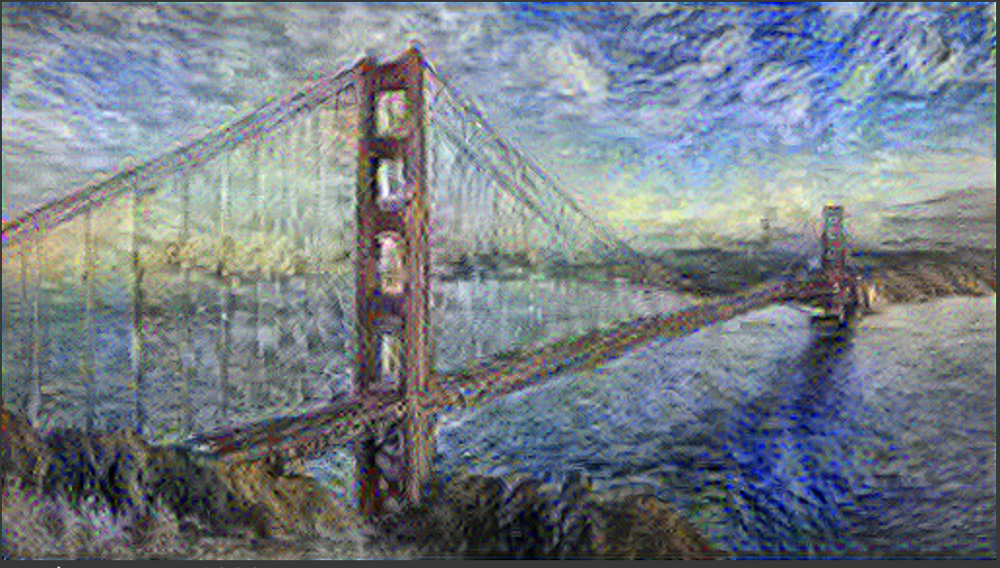

In [ ]:
print('epoch 9')
Image(filename='/content/drive/MyDrive/5.png')

## Results

1. Our model works will, we could generate images with any degree of fusion and any sophistication of detail.


2. What about these results meet your prediction? Why?

  *We believe our model meet my prediction. It produces the image from with the shape of content image and the style from the style image.*

3. Did your models over- or under-fit? How can you tell? What did you do to address these issues?

  *If we run too many epochs, the result image would overfit, if we run too less epoch, the underfitting issue is serious, thus we many carefully decide the number of epochs.*

4. How do you expect these models might behave differently on different data?  

  *With different content and style images, our result image would be much more different. The result depends on the two input images.*

Result Example


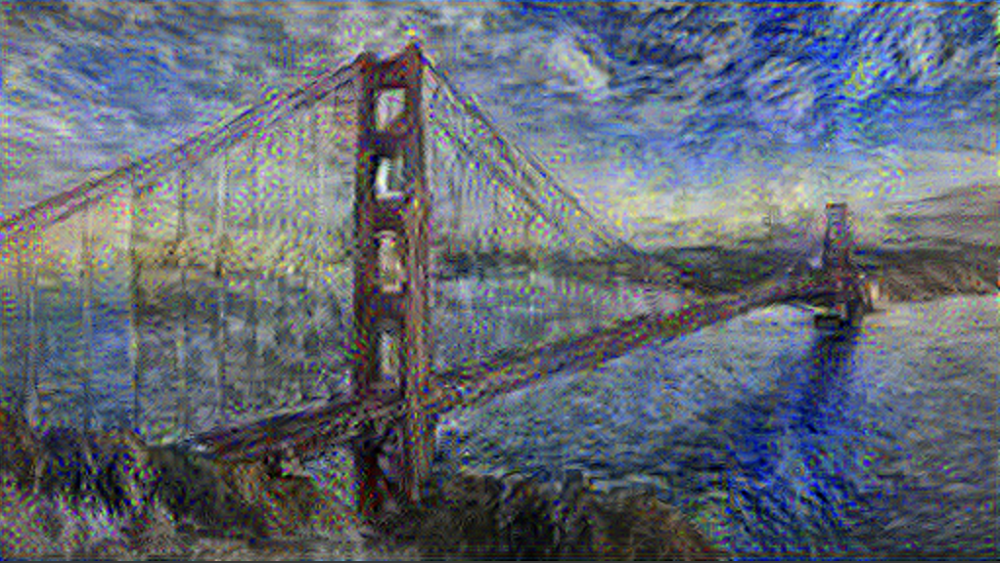

In [ ]:
# Show plots or visualizations of your evaluation metric(s) on the train and test sets.
#   Are there aspects of your results that are difficult to visualize? Why?
    #No, our result is always image, thus it is easy to show
print('Result Example')
Image(filename='/content/drive/MyDrive/res.png')

# Discussion

## What you've learned

*Note: you don't have to answer all of these, and you can answer other questions if you'd like. We just want you to demonstrate what you've learned from the project.*

1. What concepts from lecture/breakout were most relevant to your project? How so?

  *Actually our idea is from the end of the Deep Learning lecture. It quickly introduce generative model and give an exmaple picture of art style transfer. We are inspired by that and decide to finish this project*

2. What aspects of your project did you find most surprising?

  *At first we just think our project could only give colors to a black white image, but later we are surprisingly finding that we could do real artistic style transfer and produce images that look similiar to the great art works like Dali anf Picasso.*

3. What lessons did you take from this project that you want to remember for the next ML project you work on? Do you think those lessons would transfer to other datasets and/or models? Why or why not?

  *We learn the difference between discrimitive model and generative model. In general, I think our learning in generative model could easily be transferred to other similar projects.*

4. If you had two more weeks to work on this project, what would you do next? Why?

  *You can find our result although finish the art style tranfer, it still has noise issue that negatively influence the quality of style transfer, thus we want to implement useful regularization function to reduce noises.*

## Reference


[1] *Artistic style transfer with tensorflow.* TensorFlow. (n.d.). Retrieved December 7, 2022, from https://www.tensorflow.org/lite/examples/style_transfer/overview

[2] Simonyan, K., & Zisserman, A. (2015, April 10). *Very deep convolutional networks for large-scale image recognition.* arXiv.org. Retrieved December 7, 2022, from https://arxiv.org/abs/1409.1556

[3] *VGG-19 Convolutional Neural Network.* https://blog.techcraft.org/vgg-19-convolutional-neural-network/